In [1]:
!pip install -U plotly
!pip install -q git+https://github.com/tensorflow/docs

     |████████████████████████████████| 13.2MB 226kB/s 
  Found existing installation: plotly 4.4.1
    Uninstalling plotly-4.4.1:
      Successfully uninstalled plotly-4.4.1
     |████████████████████████████████| 1.0MB 18.0MB/s 


In [2]:
import tensorflow as tf
import pandas as pd
import numpy as np 
import seaborn as sns
import plotly 



import IPython
import IPython.display

from sklearn import preprocessing, metrics  
import matplotlib.pyplot as plt
import importlib.util
import datetime
import time
import shutil
import os


from sklearn.preprocessing import StandardScaler

import keras.backend as K


from google.colab import drive
import sys

%load_ext tensorboard

pd.options.plotting.backend = "plotly"

# np.set_printoptions(threshold=np.inf)
# pd.set_option("display.max_rows", None, "display.max_columns", None)

drive.mount("/content/drive")
spec = importlib.util.spec_from_file_location("generalUtilityFunctions.py","./drive/MyDrive/Colab_Notebooks/generalUtilityFunctions.py")
gUF = importlib.util.module_from_spec(spec)
spec.loader.exec_module(gUF)

Mounted at /content/drive


In [3]:
# inspired by 
# https://machinelearningmastery.com/use-different-batch-sizes-training-predicting-python-keras/
# https://www.tensorflow.org/tutorials/text/text_generation

df = pd.read_pickle("./drive/MyDrive/Colab_Notebooks/bachelor_data/DATA_hourly_inside.pkl")
# test
df.interpolate(method='time', axis=0, limit=None, inplace=True, limit_direction='both')
# test

df['q','MARI'].interpolate(method='time', axis=0, limit=None, inplace=True, limit_direction='both')
df.reset_index(inplace= True)

n = len(df)
train_n = int(n*0.7)
val_n = int(n*0.9)

df.columns = [' '.join(col).strip().replace(' ','_') for col in df.columns.values]
times_test = df['TimeStamp'][val_n:]

times_s = df['TimeStamp'].map(datetime.datetime.timestamp)
df.drop('TimeStamp', 1, inplace=True)

day = 24*60*60
year = (365.2425)*day

# test2 only q_MAri
# df.drop(columns=['q_CHAU', 'q_FURT', 'q_GOGM', 'q_HIRB', 'q_KIEN', 'q_KOET','q_KOTH', 'q_LEMI', 'q_LOHB', 'q_LOHM', 'q_OESB', 'q_SAEG', 'q_TEAC', 'q_TEAT', 'q_VIER', 'q_ZWIE', 'q_ZWIG'], inplace = True)
# test3
# df.drop(columns=['q_CHAU', 'q_LOHM', 'q_TEAC',  'q_ZWIE'], inplace = True)


df['yearsin'] = np.sin(times_s * (2 * np.pi / year))
df['yearcos'] = np.cos(times_s * (2 * np.pi / year))

print(f'{list(df.columns)}, len: {len(list(df.columns))}')

print(df['q_MARI'].head())


# create train, val and test df
train_df = df[:train_n]
val_df = df[train_n:val_n]
test_df = df[val_n:]

num_features = df.shape[1]
print(num_features)
print(train_df.shape)

# normalize the data
train_mean = train_df.mean()
train_std = train_df.std()


train_df_normal = (train_df - train_mean) / train_std
val_df_normal = (val_df - train_mean) / train_std
test_df_normal = (test_df - train_mean) / train_std


fill_value = -7.0
train_df_normal_fill = train_df_normal.fillna(fill_value)
val_df_normal_fill = val_df_normal.fillna(fill_value)
test_df_normal_fill = test_df_normal.fillna(fill_value)



['n_LIND', 'n_NEUH', 'n_NITT', 'n_RODI', 'n_SCHK', 'n_TEIS', 'n_WEID', 'n_KIBE', 'n_LAML', 'n_REGE', 'n_ZWIE', 'n_POES', 'n_KITE', 'n_SANK', 'q_CHAU', 'q_FURT', 'q_GOGM', 'q_HIRB', 'q_KIEN', 'q_KOET', 'q_KOTH', 'q_LEMI', 'q_LOHB', 'q_LOHM', 'q_MARI', 'q_OESB', 'q_SAEG', 'q_TEAC', 'q_TEAT', 'q_VIER', 'q_ZWIE', 'q_ZWIG', 'rflu_REGE', 'rflu_POES', 'rflu_KITE', 'tlu_SCHK', 'tlu_REGE', 'tlu_POES', 'tlu_KITE', 'ttau_REGE', 'xglob_POES', 'xglob_KITE', 'xludr_REGE', 'xwind_REGE', 'xwind_KITE', 'zsos_REGE', 'yearsin', 'yearcos'], len: 48
0    35.1
1    35.1
2    35.1
3    35.1
4    35.1
Name: q_MARI, dtype: float64
48
(79615, 48)


In [ ]:
len(times_test)

11374

In [ ]:
# https://www.tensorflow.org/tutorials/structured_data/time_series

class WindowGenerator():
  def __init__(self, input_width, label_width, shift,
               train_df=train_df_normal_fill, val_df=val_df_normal_fill, test_df=test_df_normal_fill,
               label_columns=None, shuffle = False, batch_size = 32):
    # Store the raw data.
    self.train_df = train_df
    self.val_df = val_df
    self.test_df = test_df

    # store some more options
    self.shuffle = shuffle
    self.batch_size = batch_size

    # Work out the label column indices.
    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    # Work out the window parameters.
    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift

    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]

    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])


  def split_window(self, features):
    inputs = features[:, self.input_slice, :]
    labels = features[:, self.labels_slice, :]

    if self.label_columns is not None:
      labels = tf.stack(
          [labels[:, :, self.column_indices[name]] for name in self.label_columns],
          axis=-1)

    # Slicing doesn't preserve static shape information, so set the shapes
    # manually. This way the `tf.data.Datasets` are easier to inspect.
    inputs.set_shape([None, self.input_width, None])
    labels.set_shape([None, self.label_width, None])
    return inputs, labels

  def plot(self, model=None, plot_col='q_MARI', max_subplots=3):
    inputs, labels = self.example
    plt.figure(figsize=(12, 8))
    plot_col_index = self.column_indices[plot_col]
    max_n = min(max_subplots, len(inputs))
    for n in range(max_n):
      plt.subplot(3, 1, n+1)
      plt.ylabel(f'{plot_col} [normed]')
      plt.plot(self.input_indices, inputs[n, :, plot_col_index],
              label='Inputs', marker='.', zorder=-10)

      if self.label_columns:
        label_col_index = self.label_columns_indices.get(plot_col, None)
      else:
        label_col_index = plot_col_index

      if label_col_index is None:
        continue

      plt.scatter(self.label_indices, labels[n, :, label_col_index],
                  edgecolors='k', label='Labels', c='#2ca02c', s=64)
      if model is not None:
        predictions = model(inputs)
        plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                    marker='X', edgecolors='k', label='Predictions',
                    c='#ff7f0e', s=64)

      if n == 0:
        plt.legend()

    plt.xlabel('Time [h]')


  def make_dataset(self, data):
    data = np.array(data, dtype=np.float32)

    # todo: discuss parameters !!!
    ds = tf.keras.preprocessing.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=self.shuffle,
      batch_size=self.batch_size)
    
    ds = ds.map(self.split_window)
    return ds

  @property
  def train(self):
    return self.make_dataset(self.train_df)

  @property
  def val(self):
    return self.make_dataset(self.val_df)

  @property
  def test(self):
    return self.make_dataset(self.test_df)

    
  @property
  def example(self):
    """Get and cache an example batch of `inputs, labels` for plotting."""
    result = getattr(self, '_example', None)
    if result is None:
      # No example batch was found, so get one from the `.train` dataset
      result = next(iter(self.train))
      # And cache it for next time
      self._example = result
    return result

  @example.setter
  def example(self, value):
      self.example = value

In [4]:
# abc

def pick_median(arg_tensor):
    the_upper_tensor = tf.contrib.distributions.percentile(arg_tensor, 50, interpolation='higher')
    the_lower_tensor = tf.contrib.distributions.percentile(arg_tensor, 50, interpolation='lower')

    final_tensor = (the_upper_tensor + the_lower_tensor) / 2
    # print(the_count.eval(session=keras.backend.get_session()))

    return final_tensor

def maxe(y_true, y_pred):
  if not tf.is_tensor(y_pred):
        y_pred = K.constant(y_pred)
  y_true = K.cast(y_true, y_pred.dtype)
  return  K.max(y_pred- y_true)


def mae(y_true, y_pred):
  if not tf.is_tensor(y_pred):
        y_pred = K.constant(y_pred)
  y_true = K.cast(y_true, y_pred.dtype)
  return  pick_median(K.abs(y_pred- y_true))

def rev(y_true, y_pred):
    if not tf.is_tensor(y_pred):
        y_pred = K.constant(y_pred)
    y_true = K.cast(y_true, y_pred.dtype)
    return (K.sum(y_pred) - K.sum(y_true)) / K.sum(y_true) * 100


def nse(y_true, y_pred):
  if not tf.is_tensor(y_pred):
        y_pred = K.constant(y_pred)
  y_true = K.cast(y_true, y_pred.dtype)
  
  return 1 - (K.sum((y_pred - y_true) ** 2) / K.sum((y_true - K.mean(y_true))**2))



def get_metrics():
  rmse =  tf.keras.metrics.RootMeanSquaredError()
  meae = tf.keras.metrics.MeanAbsoluteError()
  return [rmse, nse,  meae, maxe, rev]

def get_metric_names():
   return ["rmse", "nse",  "meae", "maxe", "rev"]

In [ ]:
def compute_metrics(ys, y_hats):
  
  return {
    "maxe" : maxe(ys, y_hats).numpy(),
    # "maer" :  median_absolute_error(ys, df["y_hats"]),
    "rev"  : rev(ys, y_hats).numpy(),
    "nse" : nse(ys, y_hats).numpy(),
    "mse" : tf.keras.losses.mean_squared_error(ys, y_hats).numpy(),
    "rmse" :  tf.math.sqrt( tf.keras.losses.mean_squared_error(ys, y_hats)).numpy(),
    "meae" : tf.keras.losses.MeanAbsoluteError()(ys, y_hats).numpy()
}

In [ ]:
WINDOW_SIZE = 250

# todo: adjust
# custamise input and labe
# window_0 = WindowGenerator(input_width= WINDOW_SIZE, label_width=WINDOW_SIZE, shift=1,
#                     label_columns=['q_MARI'])
path = "./drive/MyDrive/Colab_Notebooks/bachelor_models/multishot_seq2seq/application/"


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
LSTM_1 (LSTM)                (None, 250, 64)           28928     
_________________________________________________________________
Dropout_2 (Dropout)          (None, 250, 64)           0         
_________________________________________________________________
time_distributed (TimeDistri (None, 250, 1)            65        
Total params: 28,993
Trainable params: 28,993
Non-trainable params: 0
_________________________________________________________________


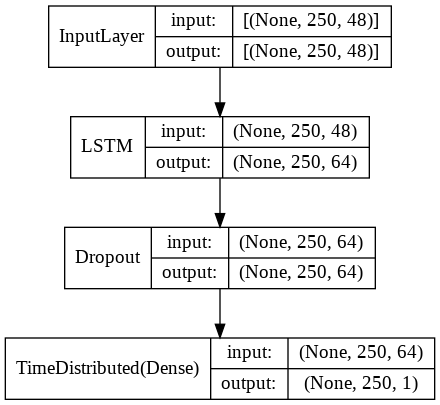

In [ ]:
mod2_name = "test1"
p = "./drive/MyDrive/Colab_Notebooks/bachelor_models/multishot_seq2seq/2021_03_01/"
mod2_path = os.path.join(p, mod2_name)


mod2 = tf.keras.models.load_model(mod2_path,
      custom_objects={"maxe": maxe, 
                  "meae": mae, 
                  "rev": rev, 
                  "nse": nse})
    
mod2.compile(loss=tf.losses.MeanSquaredError(), optimizer="adam", metrics=get_metrics())
mod2.summary()

img_file = "test2.png"
tf.keras.utils.plot_model(mod2, to_file=img_file, show_shapes=True, show_layer_names=False)

In [ ]:
test_df_normal.shape

(11374, 44)

In [ ]:
p = "./drive/MyDrive/Colab_Notebooks/bachelor_models/multishot_seq2seq/evaluation/temp/"


In [ ]:
n_batch = 1
num_features = 31

p = "./drive/MyDrive/Colab_Notebooks/bachelor_models/multishot_seq2seq/evaluation/temp/"
mod3_name = "window_size=250_num_units=64_dropout=0.5_optimizer=adam_learning_rate=0.0001_batch_size=32_nr_layers=1_0_onlyMari"

mod3_path = os.path.join(p,mod3_name)

mod3 = tf.keras.models.load_model(mod3_path,
      custom_objects={"maxe": maxe, 
                  "meae": mae, 
                  "rev": rev, 
                  "nse": nse})
predict_mod3 =  tf.keras.models.Sequential([
      tf.keras.layers.LSTM(64, batch_input_shape=(1, 1, num_features), 
                           stateful=True,return_sequences=True),
      tf.keras.layers.Dropout(0.1),
      tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(1))])

predict_mod3.set_weights(mod3.get_weights())
predict_mod3.compile(loss=tf.losses.MeanSquaredError(), optimizer="adam", metrics=get_metrics())

colum_q_MARI = list(test_df_normal_fill.columns).index('q_MARI')
ys = test_df_normal_fill['q_MARI'].copy().to_numpy()

res3 = apply_methode2(predict_model = predict_mod3, num_features= num_features)

In [ ]:
df_mod3 = pd.read_pickle(p + "only_qMari.pkl")


df_mod3.rename(columns={"y_hats": "predicted", "ys": "true"}, inplace=True)

df_mod3.plot(y = ["true", "predicted"], labels={
                     "value": "discharge in [m^3/s] ",
                     "TimeStamp": "time in hours"}
                ,  width=2*500,
                      height=500)

In [ ]:
df_mod3 = pd.DataFrame({"ys": ys, "y_hats": res3})
df_mod3 = (df_mod3*train_std['q_MARI'])+train_mean['q_MARI']
df_mod3.index = times_test
df_mod3.to_pickle(p + "only_qMari.pkl")
df_mod3.plot(y = ["y_hats","ys"])


In [ ]:
metrics6 = compute_metrics(df_mod3)
metrics6

{'maxe': 46.562897,
 'meae': 4.639616966247559,
 'mse': 78.79605767052337,
 'nse': 0.82175696,
 'rev': 1.3344542,
 'rmse': 8.876714351071762}

In [ ]:
p = "./drive/MyDrive/Colab_Notebooks/bachelor_models/multishot_seq2seq/evaluation/temp/"

In [ ]:
n_batch = 1
num_features = 44

p = "./drive/MyDrive/Colab_Notebooks/bachelor_models/multishot_seq2seq/evaluation/temp/"
mod4_name = "window_size=250_num_units=64_dropout=0.5_optimizer=adam_learning_rate=0.0001_batch_size=32_nr_layers=1_0_excludingFaulty"

mod4_path = os.path.join(p,mod4_name)

mod4 = tf.keras.models.load_model(mod4_path,
      custom_objects={"maxe": maxe, 
                  "meae": mae, 
                  "rev": rev, 
                  "nse": nse})
predict_mod4 =  tf.keras.models.Sequential([
      tf.keras.layers.LSTM(64, batch_input_shape=(1, 1, num_features), 
                           stateful=True,return_sequences=True),
      tf.keras.layers.Dropout(0.1),
      tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(1))])

predict_mod4.set_weights(mod4.get_weights())
predict_mod4.compile(loss=tf.losses.MeanSquaredError(), optimizer="adam", metrics=get_metrics())

colum_q_MARI = list(test_df_normal_fill.columns).index('q_MARI')
ys = test_df_normal_fill['q_MARI'].copy().to_numpy()

# res4 = apply_methode2(predict_model = predict_mod4, num_features= num_features)

NameError: ignored

In [ ]:
df_mod4 = pd.DataFrame({"ys": ys, "y_hats": res4})
df_mod4 = (df_mod4*train_std['q_MARI'])+train_mean['q_MARI']
df_mod4.index = times_test
df_mod4.to_pickle(p + "excludingFaulty.pkl")
df_mod4.plot(y = ["y_hats","ys"])


In [ ]:
df_mod4 = pd.read_pickle(p + "excludingFaulty.pkl")

df_mod4.rename(columns={"y_hats": "predicted", "ys": "true"}, inplace=True)

df_mod4.plot(y = ["true", "predicted"], labels={
                     "value": "discharge in [m^3/s] ",
                     "TimeStamp": "time in hours"}
                ,  width=2*500,
                      height=500)

In [ ]:
metrics6 = compute_metrics(df_mod4)
metrics6

{'maxe': 19.569054,
 'meae': 2.344984292984009,
 'mse': 14.244911393279022,
 'nse': 0.96777683,
 'rev': -0.16413382,
 'rmse': 3.7742431550284383}

In [ ]:
n_batch = 1
num_features = 48

predict_mod2 =  tf.keras.models.Sequential([
      tf.keras.layers.LSTM(64, batch_input_shape=(1, 1, num_features), 
                           stateful=True,return_sequences=True),
      tf.keras.layers.Dropout(0.1),
      tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(1))])

predict_mod2.set_weights(mod2.get_weights())
predict_mod2.compile(loss=tf.losses.MeanSquaredError(), optimizer="adam", metrics=get_metrics())

colum_q_MARI = list(test_df_normal_fill.columns).index('q_MARI')
ys = test_df_normal_fill['q_MARI'].copy().to_numpy()

In [ ]:
res = apply_methode2(predict_model = predict_mod2)

In [ ]:
p

'./drive/MyDrive/Colab_Notebooks/bachelor_models/multishot_seq2seq/2021_03_01/'

In [ ]:
df_mod2 = pd.DataFrame({"ys": ys, "y_hats": res})
df_mod2 = (df_mod2*train_std['q_MARI'])+train_mean['q_MARI']
df_mod2.index = times_test
df_mod2.to_pickle(p + "liner_interpolation_results.pkl")
df_mod2.plot(y = ["y_hats","ys"])


In [ ]:
seq2seq_df = df_mod2.copy()


In [ ]:
metrics5 = compute_metrics(df_mod2)
metrics5

{'maxe': 14.22562,
 'meae': 2.4970669746398926,
 'mse': 14.176819406040918,
 'nse': 0.9679309,
 'rev': 0.6284931,
 'rmse': 3.7652117345563605}

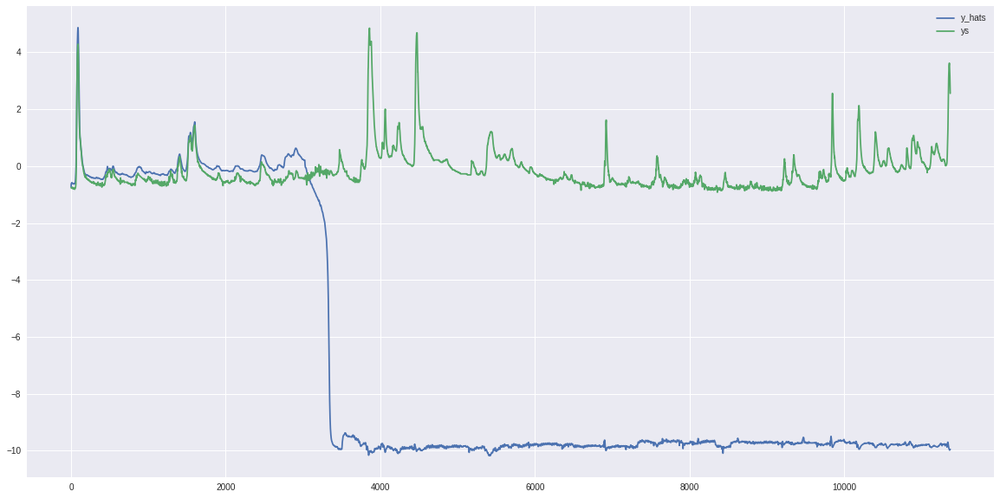

In [ ]:
df_mod2 = pd.DataFrame({"ys": ys, "y_hats": res})
# df_mod2 = (df_mod2*train_std['q_MARI'])+train_mean['q_MARI']
df_mod2.plot(y = ["y_hats","ys"], use_index = True, figsize=(20,10))

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
LSTM_1 (LSTM)                (None, 250, 128)          90624     
_________________________________________________________________
Dropout_1 (Dropout)          (None, 250, 128)          0         
_________________________________________________________________
time_distributed_8 (TimeDist (None, 250, 1)            129       
Total params: 90,753
Trainable params: 90,753
Non-trainable params: 0
_________________________________________________________________


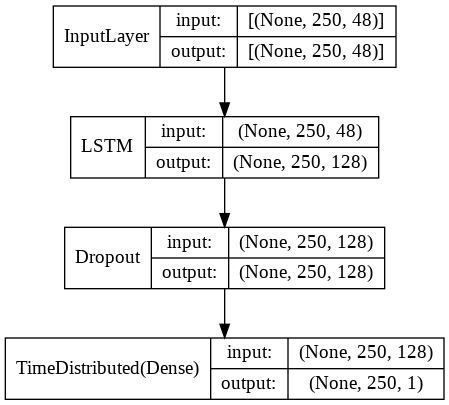

In [ ]:
model_name = "window_size=250_num_units=128_dropout=0.5_optimizer=adam_learning_rate=0.0001_batch_size=32_nr_layers=1"
model_path = os.path.join(path, model_name)

model = tf.keras.models.load_model(model_path,
      custom_objects={"maxe": maxe, 
                  "meae": mae, 
                  "rev": rev, 
                  "nse": nse})
    
model.compile(loss=tf.losses.MeanSquaredError(), optimizer="adam", metrics=get_metrics())
model.summary()

img_file = "test.png"
tf.keras.utils.plot_model(model, to_file=img_file, show_shapes=True, show_layer_names=False)

In [ ]:
n_batch = 1
num_features = 48

predict_model =  tf.keras.models.Sequential([
      tf.keras.layers.LSTM(128, batch_input_shape=(1, 1, num_features), 
                           stateful=True,return_sequences=True, name="LSTM_1"),
      tf.keras.layers.Dropout(0.1, name="Dropout_1"),
      tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(1))])

predict_model.set_weights(model.get_weights())
predict_model.compile(loss=tf.losses.MeanSquaredError(), optimizer="adam", metrics=get_metrics())

colum_q_MARI = list(test_df_normal_fill.columns).index('q_MARI')
ys = test_df_normal_fill['q_MARI'].copy().to_numpy()

In [ ]:
path

'./drive/MyDrive/Colab_Notebooks/bachelor_models/multishot_seq2seq/application/'

In [ ]:
def apply_methode1(predict_model ):

    xs1 = val_df_normal_fill[-1:].copy()
    xs1 = xs1.append(test_df_normal_fill.copy()).to_numpy()
    y_hat = xs1[0,colum_q_MARI]

    prediction_steps1 = len(ys)  # <= 22746
    y_hats1 = [] # store all true predictions

    predict_model.reset_states()
    for i in range(prediction_steps1):
      x = xs1[i]
      x[colum_q_MARI] = y_hat
      x = x.reshape(1, 1, num_features)
      y_hat_new = predict_model.predict(x)
      y_hat_new = y_hat_new.flatten()[0]
      y_hats1.append(y_hat_new)
      y_hat = y_hat_new

    y_hats1 = np.asarray(y_hats1)
    return y_hats1

In [ ]:
nr_runs = 3
results = []
times = []

for i in range(nr_runs):
  print(f'{i/nr_runs}')
  t0 = time.time()
  results.append(apply_methode1())
  times.append( time.time()-t0)

0.0
0.3333333333333333
0.6666666666666666


In [ ]:
mean_time_m1 = np.mean(np.asarray(times))
mean_yhat_m1 = np.mean(np.asarray(results), axis=0)

df_results1 = pd.DataFrame({"ys": ys, "y_hats": mean_yhat_m1})
df_results_dnorm1 = (df_results1*train_std['q_MARI'])+train_mean['q_MARI']
df_results_dnorm1.index = times_test

df_results_dnorm1.to_pickle(path + "mean_result1.pkl")

In [ ]:
df_results_dnorm1 = pd.read_pickle(path + "mean_result1.pkl")
df_results_dnorm1.plot(y = ["y_hats","ys"]             
                     )



In [ ]:
df_results_dnorm1["errors"] = df_results_dnorm1['ys']-df_results_dnorm1['y_hats']
df_results_dnorm1.plot(y = [ "errors"])

In [ ]:
df_results_dnorm1["std_errors"] = (df_results_dnorm1["errors"] - df_results_dnorm1["errors"].mean())/df_results_dnorm1["errors"].std()
df_results_dnorm1.plot(y = [ "std_errors"])

[]

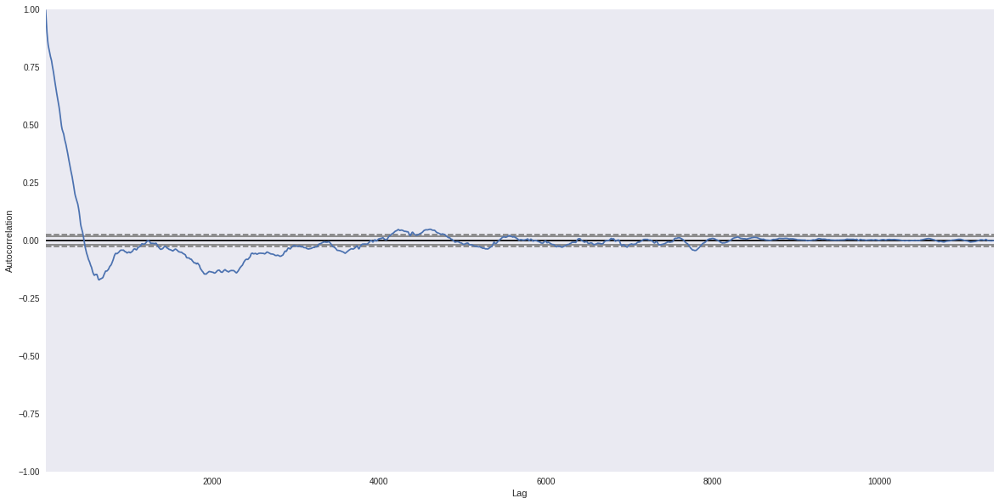

In [ ]:
plt.figure(figsize=(20,10))
x = pd.plotting.autocorrelation_plot(df_results_dnorm1["std_errors"])
x.plot() 

In [ ]:
# second algorithm approach
def apply_methode2(predict_model, val_df_normal_fill = val_df_normal_fill, num_features=num_features,colum_q_MARI=colum_q_MARI):
  y_hats2 = []

  # get last two days from validation set
  past_days = 4
  past_hours = past_days*24

  futur_days = 1
  futur_hours = futur_days*24

  xs2 = val_df_normal_fill[-past_hours:].copy()
  xs2 = xs2.append(test_df_normal_fill.copy()).to_numpy()

  for i in range((len(ys)//futur_hours)+1):
    s_warmup = i* futur_hours
    e_warmup = s_warmup + past_hours

    predict_model.reset_states()
    # warmup for 96h
    for j in range(s_warmup,e_warmup):
      x = xs2[j]
      x = x.reshape(1, 1, num_features)
      predict_model.predict(x)

    # predictions for 24h
    y_hat = xs2[e_warmup,colum_q_MARI]
    for j in range(e_warmup,min(e_warmup+futur_hours, len(xs2))):
      # important to protect the x2 "true values"
      x = xs2[j].copy()
      x[colum_q_MARI] = y_hat

      x = x.reshape(1, 1, num_features)
      y_hat_new = predict_model.predict(x)
      y_hat_new = y_hat_new.flatten()[0]
      y_hats2.append(y_hat_new)
      y_hat = y_hat_new

  return np.asarray(y_hats2)

In [ ]:
m1_name = "m1"
m2_name = "m2"
m3_name = "m3"

model_names = ["m1", "m2","m3"]
source_models = [ tf.keras.models.load_model(os.path.join(path, "3times_best_model", mn),
      custom_objects={"maxe": maxe,  "meae": mae,     "rev": rev,   "nse": nse}) for mn in model_names]

predict_models = [ tf.keras.models.Sequential([
                                    tf.keras.layers.LSTM(128, batch_input_shape=(1, 1, num_features), stateful=True,return_sequences=True, name="LSTM_1"),
                                    tf.keras.layers.Dropout(0.1, name="Dropout_1"), 
                                    tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(1))])
                    for mn in model_names]

for sm, pm in zip(source_models, predict_models):
  # sm.compile(loss=tf.losses.MeanSquaredError(), optimizer="adam", metrics=get_metrics())
  pm.set_weights(sm.get_weights())
  pm.compile(loss=tf.losses.MeanSquaredError(), optimizer="adam", metrics=get_metrics())


In [ ]:
results2 = []
times2 = []

for i, pm in enumerate(predict_models):
  print(f'{i/len(predict_models)}')
  t0 = time.time()
  results2.append(apply_methode2(pm))
  times2.append( time.time()-t0)

0.0
0.3333333333333333
0.6666666666666666


In [ ]:
print(len(results2[0]))
print(len(ys))

11374
11374


In [ ]:
mean_time_m2 = np.mean(np.asarray(times2))
# 2098.2049058278403
mean_yhat_m2 = np.mean(np.asarray(results2), axis=0)


df_results2 = pd.DataFrame({"ys": ys, "y_hats": mean_yhat_m2})
df_results_dnorm2 = (df_results2*train_std['q_MARI'])+train_mean['q_MARI']
df_results_dnorm2.index = times_test
df_results_dnorm2.to_pickle(path + "mean_result_3models.pkl")


In [ ]:
mean_time_m2

2098.2049058278403

In [ ]:
df_3models.columns

Index(['ys', 'y_hats'], dtype='object')

In [ ]:
df_3models = pd.read_pickle(path + "mean_result_3models.pkl")

df_3models.rename(columns={'ys': 'true', 'y_hats': 'predicted'}, inplace=True)

# mean_time_m2: 1723s =~ 30min

df_3models.plot(y = ["true","predicted"],
                labels={
                     "value": "discharge in [m^3/s] ",
                     "TimeStamp": "time in hours"}
                ,  width=2*500,
                      height=500)

In [ ]:
df_3models["errors"] = df_3models['true']-df_3models['predicted']
df_3models.plot(y = ["errors"],
                labels={
                     "value": "prediction error in [m^3/s] ",
                     "TimeStamp": "time in hours"}
                ,  width=2*500,
                      height=500)

In [ ]:
df_results_dnorm2 = pd.read_pickle(path + "mean_result2.pkl")

# mean_time_m2: 1723s =~ 30min

df_results_dnorm2.plot(y = ["y_hats","ys"])

In [ ]:
df_results_dnorm2["errors"] = df_results_dnorm2['ys']-df_results_dnorm2['y_hats']
df_results_dnorm2.plot(y = [ "errors"])

In [ ]:
df_results_dnorm2["std_errors"] = (df_results_dnorm2["errors"] - df_results_dnorm2["errors"].mean())/df_results_dnorm2["errors"].std()
df_results_dnorm2.plot(y = [ "std_errors"])

[]

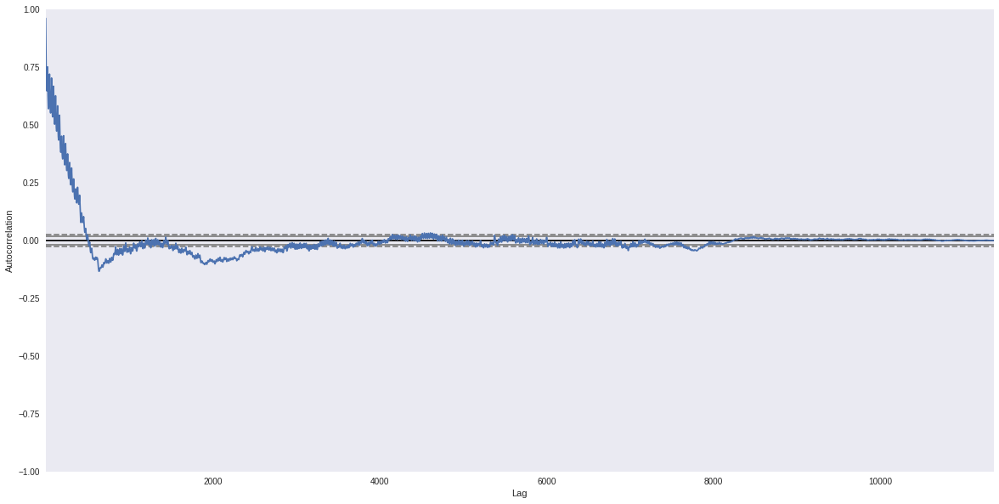

In [ ]:
plt.figure(figsize=(20,10))
x = pd.plotting.autocorrelation_plot(df_results_dnorm2["std_errors"])
x.plot() 

In [ ]:
len(ys[: -18])

11356

In [ ]:
# load LARSIM data model

larsim_df =  pd.read_pickle(os.path.join(path,  "larsim_output_MARI_2005_2017.pkl"))
larsim_df = larsim_df.drop(['Index_run', 'Type', 'Stationskennung'], axis=1)
larsim_df = larsim_df.set_index("TimeStamp")

test_larsim = larsim_df[larsim_df.index >= "2016-09-15 02:00:00"]
print(test_larsim.columns)

print(len(test_larsim))
print(len(ys[: -18]))

# larsim misses lasst 18 hours of predictions
larsim_results_df =  pd.DataFrame({"discharge": (ys[: -18]*train_std['q_MARI'])+train_mean['q_MARI'], "larsim_predictions": test_larsim['Value']})
larsim_results_df.to_pickle(path + "larsim_result.pkl")


NameError: ignored

In [ ]:
print(larsim_results_df.columns)
larsim_results_df.plot(y = ['discharge', 'larsim_predictions'], labels = {"TimeStamp": "Time", "value": "Discharge"})

Index(['discharge', 'larsim_predictions'], dtype='object')


In [ ]:
larsim_results_df["errors"] = larsim_results_df['ys']-larsim_results_df['y_hats']
larsim_results_df.plot(y = [ "errors"])

In [ ]:
larsim_results_df["std_errors"] = (larsim_results_df["errors"] - larsim_results_df["errors"].mean())/df_results_dnorm2["errors"].std()
larsim_results_df.plot(y = [ "std_errors"])

[]

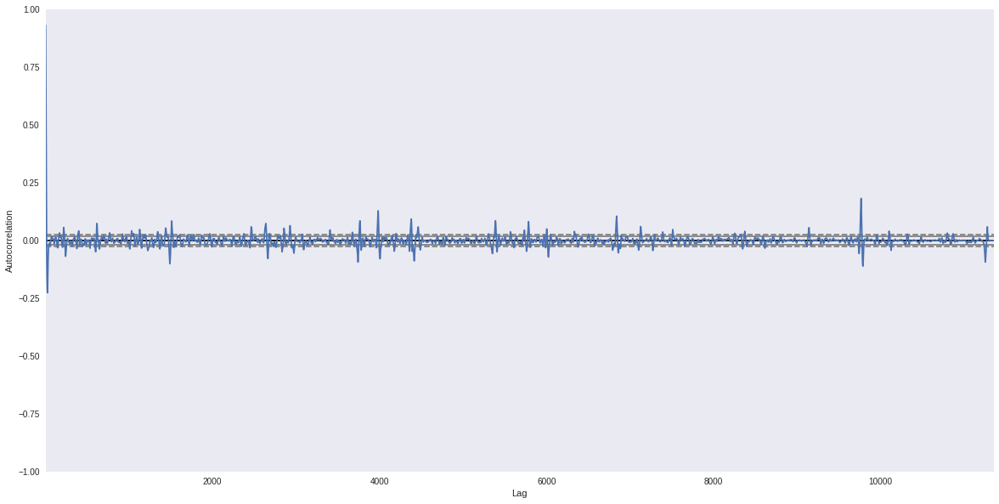

In [ ]:
plt.figure(figsize=(20,10))
x = pd.plotting.autocorrelation_plot(larsim_results_df["std_errors"])
x.plot() 

In [ ]:
metrics1 = compute_metrics(df_results_dnorm1)
metrics2= compute_metrics(df_results_dnorm2)
metrics_larsim = compute_metrics(larsim_results_df)

print(f'methode1: {metrics1}')
print(f'metrics2: {metrics2}')
print(f'larsim  : {metrics_larsim}')

methode1: {'maxe': 29.371933, 'rev': -11.029948, 'nse': 0.82041806, 'mse': 79.38793766728602, 'rmse': 8.909990890415434, 'meae': 4.578758716583252}
metrics2: {'maxe': 37.66926, 'rev': -5.8383093, 'nse': 0.9171616, 'mse': 34.932108642363836, 'rmse': 5.910339130909819, 'meae': 2.754469871520996}
larsim  : {'maxe': 74.100006, 'rev': 0.5340651, 'nse': 0.9466586, 'mse': 22.6856067273751, 'rmse': 4.762940974584411, 'meae': 1.9472891092300415}


In [ ]:
metrics_larsim


{'maxe': 74.100006,
 'meae': 1.9472891092300415,
 'mse': 22.6856067273751,
 'nse': 0.9466586,
 'rev': 0.53409135,
 'rmse': 4.762940974584411}

In [ ]:
larsim_df = pd.read_pickle("./drive/MyDrive/Colab_Notebooks/bachelor_models/multishot_seq2seq/" + "larsim_result.pkl")
larsim_df.rename(columns={"larsim_predictions": "predicted", "discharge": "true"}, inplace=True)
larsim_df.plot(y = ["true", "predicted"], labels={
                     "value": "discharge in [m^3/s] ",
                     "TimeStamp": "time in hours"}
            )

In [11]:
seq2seq_df = pd.read_pickle("./drive/MyDrive/Colab_Notebooks/bachelor_models/multishot_seq2seq/" + "liner_interpolation_results.pkl")

seq2seq_df.rename(columns={"y_hats": "predicted", "ys": "true"}, inplace=True)
seq2seq_df.plot(y = ["true", "predicted"], labels={
                     "value": "discharge in [m^3/s] ",
                     "TimeStamp": "time in hours"}
                ,  width=4000*1/4,
                      height=3000*1/4)

In [12]:
encdec_df = pd.read_pickle("./drive/MyDrive/Colab_Notebooks/bachelor_models/encoder_decoder/" + "encdec_results.pkl")
encdec_df.rename(columns={"y_hats": "predicted", "ys": "true"}, inplace=True)
encdec_df.plot(y = ["true", "predicted"], labels={
                     "value": "discharge in [m^3/s] ",
                     "TimeStamp": "time in hours"}
                ,  width=4000*1/4,
                      height=3000*1/4)

In [ ]:
feb17 = pd.Timestamp("2017-02-01")
apr17 = pd.Timestamp("2017-04-01")

In [ ]:
larsim_df[feb17:apr17].plot(y = ["true", "predicted"], labels={
                     "value": "discharge in [m^3/s] ",
                     "TimeStamp": "time in hours"}
                ,  width=2*500,
                      height=500)

In [ ]:
seq2seq_df[feb17:apr17].plot(y = ["true", "predicted"], labels={
                     "value": "discharge in [m^3/s] ",
                     "TimeStamp": "time in hours"}
                ,  width=2*500,
                      height=500)

In [ ]:
encdec_df[feb17:apr17].plot(y = ["true", "predicted"], labels={
                     "value": "discharge in [m^3/s] ",
                     "TimeStamp": "time in hours"}
                ,  width=2*500,
                      height=500)

In [ ]:
metrics_encdec = compute_metrics(encdec_df[feb17:apr17]["true"],encdec_df[feb17:apr17]["predicted"])
metrics_seq2seq= compute_metrics(seq2seq_df[feb17:apr17]["true"],seq2seq_df[feb17:apr17]["predicted"])
metrics_larsim = compute_metrics(larsim_df[feb17:apr17]["true"],larsim_df[feb17:apr17]["predicted"])


print(f'larsim  : {metrics_larsim}')
print(f'sed2seq: {metrics_seq2seq}')
print(f'enc dec: {metrics_encdec}')

larsim  : {'maxe': 74.100006, 'rev': 0.18416099, 'nse': 0.95555913, 'mse': 50.96614300705716, 'rmse': 7.139057571350518, 'meae': 3.141819953918457}
sed2seq: {'maxe': 8.14135, 'rev': -7.5599985, 'nse': 0.95585257, 'mse': 50.62964819396343, 'rmse': 7.115451369657686, 'meae': 4.864809513092041}
enc dec: {'maxe': 24.394455, 'rev': 2.3269148, 'nse': 0.978397, 'mse': 24.774963338838074, 'rmse': 4.977445463170649, 'meae': 3.278455972671509}


In [ ]:
jul17 = pd.Timestamp("2017-07-01")
sept17 = pd.Timestamp("2017-09-01")


In [ ]:
larsim_df[jul17:sept17].plot(y = ["true", "predicted"], labels={
                     "value": "discharge in [m^3/s] ",
                     "TimeStamp": "time in hours"}
                ,  width=2*500,
                      height=500)

In [ ]:
seq2seq_df[jul17:sept17].plot(y = ["true", "predicted"], labels={
                     "value": "discharge in [m^3/s] ",
                     "TimeStamp": "time in hours"}
                ,  width=2*500,
                      height=500)

In [ ]:
encdec_df[jul17:sept17].plot(y = ["true", "predicted"], labels={
                     "value": "discharge in [m^3/s] ",
                     "TimeStamp": "time in hours"}
                ,  width=2*500,
                      height=500)

In [ ]:
metrics_encdec = compute_metrics(encdec_df[jul17:sept17]["true"],encdec_df[jul17:sept17]["predicted"])
metrics_seq2seq= compute_metrics(seq2seq_df[jul17:sept17]["true"],seq2seq_df[jul17:sept17]["predicted"])
metrics_larsim = compute_metrics(larsim_df[jul17:sept17]["true"],larsim_df[jul17:sept17]["predicted"])


print(f'larsim  : {metrics_larsim}')
print(f'sed2seq: {metrics_seq2seq}')
print(f'enc dec: {metrics_encdec}')

larsim  : {'maxe': 21.413002, 'rev': 1.8250678, 'nse': 0.88887906, 'mse': 3.8405401974479516, 'rmse': 1.9597296235572783, 'meae': 1.2633579969406128}
sed2seq: {'maxe': 8.448048, 'rev': 9.948657, 'nse': 0.80076855, 'mse': 6.8857967076301465, 'rmse': 2.624080164101346, 'meae': 2.1342997550964355}
enc dec: {'maxe': 16.181873, 'rev': 11.711676, 'nse': 0.6456473, 'mse': 12.247067866555874, 'rmse': 3.499581098725371, 'meae': 2.5345444679260254}


In [ ]:
encdec_df.index[0]

Timestamp('2016-09-19 02:00:00')

In [ ]:
start_date = max(encdec_df.index[0], seq2seq_df.index[0], larsim_df.index[0])
end_date = min(encdec_df.index[-1], seq2seq_df.index[-1], larsim_df.index[-1])

In [ ]:
total_df = pd.DataFrame({"true": larsim_df[start_date:end_date]["true"],
                         "larsim": larsim_df[start_date:end_date]["predicted"],
                         "seq2seq": seq2seq_df[start_date:end_date]["predicted"],
                         "encdec": encdec_df[start_date:end_date]["predicted"]})

total_df.plot()